## Introduction to GANs

GANs are a type of deep learning model used for generating new data samples that resembles given dataset.
<br>
<br>
In GANs, we have two type of neural network -
1. Generator
2. Discriminator

**Generator** - It takes random noise as input and generates data similar to real datset. Its goal is to create samples that are indistinguishable from real data, effectively fooling the Discriminator.

**Discriminator** - It takes real or generated data as input and classifies them as real(from dataset) or fake(from generator). Its goal is to distinguish between real and generated data as accurately as possible.

### How GANs Work
The generator and discriminator are trained simultaneously in a min-max game.
<br>
- The Generator tries to minimize the Discriminator's ability to classify generated data as fake.
<br>
- The Discriminator tries to maximize its ability to correctly predict the generated data as real or fake.

This is modeled mathematically as:

```math
\min_G \max_D V(G, D) = \mathbb{E}_{x \sim p_{\text{data}}}[\log D(x)] + \mathbb{E}_{z \sim p_z}[\log(1 - D(G(z)))]
```

where,
- x : real data sample.
- z : random noise input to the Generator.
- G(z) : generated data sample.
- D(x) : Discriminator's probability that x is real.



## Dataset description and preprocessing steps.

We are using CIFAR-10 dataset which contains 60,000 color images of Airplane, Automobile, Bird, Cat, Deer, Dog, Frog, Horse, Ship, Truck. So discriminator have ten classes to predict from.
Each image is 32*32 pixels and each image has 3 channels
<br>
<br>
**Dataset split:**
- Training set : 50,000 images
- Test set : 10,000 images

**Preprocessing Steps:**

1. **Loading the dataset :**  It is done using load_data() function from keras.datasets.cifar10
   ```python
   (train_images, train_labels), (_, _) = tf.keras.datasets.cifar10.load_data()
   ```

2. **Reshaping the Images :**
   ```python
   train_images = train_images.reshape(train_images.shape[0], 32, 32, 3).astype('float32')
   ```
   - Each image is reshaped from (32, 32) to (32, 32, 3) to explicitly include the channel dimension (RGB has three channel).
   - This ensures compatibility with the generator and discriminator models, which are designed to work with 4D tensors: (batch_size, height, width, channels).

3. **Normalizing the pixel values :**
   ```python
   train_images = (train_images - 127.5) / 127.5
   ```
   - CIFAR pixel values range from 0 to 255. They are normalized to [-1, 1]
   - The generator uses a tanh activation function, which outputs values in the range of [-1, 1]
   - Normalizing inputs to the same range improves model stability and convergence during training.

4. **Shuffling and Batching :**
   ```python
   BUFFER_SIZE = 50000
   BATCH_SIZE = 32

   train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
   ```
   - The dataset is shuffled with a buffer size of 50,000 (the total number of CIFAR-10 training images).
   - The dataset is divided into batches of size 32 and each batch has a shape [32, 32, 32, 3]. Batching improves training efficiency and leverages parallel computation.
   

In [2]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import os
from tensorflow.keras import layers
import time
from PIL import Image

In [3]:
# Load the dataset
(train_images, train_labels), (_, _) = tf.keras.datasets.cifar10.load_data()

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step


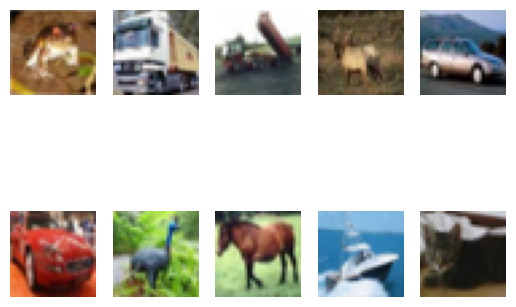

In [4]:
# Display 10 images
images = train_images[:10]
pil_images = [Image.fromarray(image) for image in images]

for i, img in enumerate(pil_images):
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.axis("off")

In [5]:
train_images = train_images.reshape(train_images.shape[0], 32, 32, 3).astype('float32') # Reshape the images from (32, 32) to (32, 32, 3) as needed by CNNs
train_images = (train_images - 127.5) / 127.5  # Normalize to [-1, 1]

In [6]:
BUFFER_SIZE = 50000
BATCH_SIZE = 32

In [7]:
# Batch and shuffle the data
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

## Model Architecture

## Generator

**Dense Layer:**
- Maps the 100-dimensional random noise vector into a 2×2×512 feature space.
- Batch Normalization stabilizes training by normalizing activations.
- LeakyReLU activation introduces non-linearity to prevent dead neurons.
  
**Reshape Layer:**
- Reshapes the 1D output of the dense layer into a 2×2×512 feature map.
- Prepares data for transposed convolutional layers.
  

**First Transposed Convolutional Layer:**
- Output Shape: (None, 4, 4, 256)
- Applies a 5×5 kernel with stride 2×2 and 'same' padding for upsampling.
- Uses Batch Normalization and LeakyReLU activation.

**Second Transposed Convolutional Layer:**
- Output Shape: (None, 8, 8, 128)
- Further upsamples the feature map to 8×8 using a 5×5 kernel and stride 2×2.
- Batch Normalization and LeakyReLU activation improve stability.

**Third Transposed Convolutional Layer:**
- Output Shape: (None, 16, 16, 64)
- Upsamples the feature map to 16×16 using another 5×5 kernel and stride 2×2.
- Uses Batch Normalization and LeakyReLU activation.

**Final Transposed Convolutional Layer:**
- Output Shape: (None, 32, 32, 3)
- Generates the final RGB image (32×32×3).
- Uses a tanh activation function to scale pixel values to [−1,1], matching the normalized input range of the discriminator.

In [8]:
# Generator model
def make_generator_model():
    generator = tf.keras.models.Sequential()

    # Dense layer
    generator.add(tf.keras.layers.Dense(2 * 2 * 512, use_bias=False, input_shape=(100,)))
    generator.add(tf.keras.layers.BatchNormalization())
    generator.add(tf.keras.layers.LeakyReLU())

    # Reshape layer
    generator.add(tf.keras.layers.Reshape((2, 2, 512)))

    # First Conv2DTranspose layer
    generator.add(tf.keras.layers.Conv2DTranspose(256, kernel_size=5, strides=2, padding="same", use_bias=False))
    generator.add(tf.keras.layers.BatchNormalization())
    generator.add(tf.keras.layers.LeakyReLU())

    # Second Conv2DTranspose layer
    generator.add(tf.keras.layers.Conv2DTranspose(128, kernel_size=5, strides=2, padding="same", use_bias=False))
    generator.add(tf.keras.layers.BatchNormalization())
    generator.add(tf.keras.layers.LeakyReLU())

    # Third Conv2DTranspose layer
    generator.add(tf.keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="same", use_bias=False))
    generator.add(tf.keras.layers.BatchNormalization())
    generator.add(tf.keras.layers.LeakyReLU())

    # Output layer
    generator.add(tf.keras.layers.Conv2DTranspose(3, kernel_size=5, strides=2, padding="same", use_bias=False, activation="tanh",))

    return generator

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


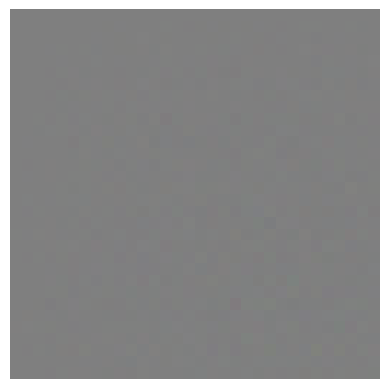

In [9]:
# Use the (as yet untrained) generator to create an image.
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generator = make_generator_model()
generated_image = generator(noise, training=False)

# Normalize image to [0,1]
generated_image = (generated_image + 1) / 2.0

# Convert tensor to NumPy array for plotting
generated_image = generated_image.numpy()

plt.imshow(generated_image[0])
plt.axis("off")
plt.show()

## Discriminator

**Convolutional Layers:**
- Four convolutional layers are used, each with a 5×5 kernel, stride of 2×2, and 'same' padding to progressively reduce spatial dimensions while preserving features.
- LeakyReLU activation is applied after each convolution to allow small gradient flow for negative values, preventing the "dying ReLU" problem.
  
**Dropout:**
- A dropout rate of 0.3 is used after each convolutional layer.
- This helps in reducing overfitting by randomly deactivating neurons during training.

**Flatten Layer:**
- Converts the 2D feature maps into a 1D vector for classification.
  
**Output Layer:**
- A single neuron with a sigmoid activation function outputs a probability score.
- This score determines whether the input image is real (close to 1) or fake (close to 0).

In [10]:
# Discriminator model
def make_discriminator_model():
    discriminator = tf.keras.models.Sequential()

    # First Conv2D layer
    discriminator.add(tf.keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="same", input_shape=(32, 32, 3)))
    discriminator.add(tf.keras.layers.LeakyReLU())
    discriminator.add(tf.keras.layers.Dropout(0.3))

    # Second Conv2D layer
    discriminator.add(tf.keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="same"))
    discriminator.add(tf.keras.layers.LeakyReLU())
    discriminator.add(tf.keras.layers.Dropout(0.3))

    # Third Conv2D layer
    discriminator.add(tf.keras.layers.Conv2D(256, kernel_size=5, strides=2, padding="same"))
    discriminator.add(tf.keras.layers.LeakyReLU())
    discriminator.add(tf.keras.layers.Dropout(0.3))

    # Fourth Conv2D layer
    discriminator.add(tf.keras.layers.Conv2D(512, kernel_size=5, strides=2, padding="same"))
    discriminator.add(tf.keras.layers.LeakyReLU())
    discriminator.add(tf.keras.layers.Dropout(0.3))

    # Flatten layer
    discriminator.add(tf.keras.layers.Flatten())

    # Output layer
    discriminator.add(tf.keras.layers.Dense(1, activation="sigmoid"))

    return discriminator

## Loss Functions

We use BinaryCrossentropy loss here because the model will predict only two values i.e real or fake

In [11]:
cross_entropy = tf.keras.losses.BinaryCrossentropy()

### Discriminator Loss
- The discriminator’s loss measures its ability to classify real images as "real" and generated images as "fake."
- The discriminator tries to output 1 for real images.
- The discriminator tries to output 0 for fake images.

In [12]:
# Discriminator loss
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

### Generator Loss

- The generator’s loss measures its ability to fool the discriminator into classifying generated images as "real."
- The generator aims for the discriminator to output 1 for its images.

In [13]:
# Generator loss
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

### Optimizers

- Adam optimizer is used in both descriminator and generator
- Learning rate is $3 * 10^-4$
- Low learning rate ensures stable training
- beta helps us smooth out oscillations during training

In [14]:
# Set up the optimizers
generator_optimizer = tf.keras.optimizers.Adam(3e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(3e-4, beta_1=0.5)

In [15]:
generator = make_generator_model()
discriminator = make_discriminator_model()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [16]:
# Save checkpoints
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [17]:
# Creates a fixed noise vector to generate images for consistent evaluation during training.
EPOCHS = 100
noise_dim = 100
num_examples_to_generate = 16 # for a 4x4 grid

seed = tf.random.normal([num_examples_to_generate, noise_dim])

## Training Strategy
- Firstly, noise vector of shape [BATCH_SIZE, noise_dim] is created.
- gen_tape and disc_tape tracks operations for generator and discriminator simultaneously so there gradient can be calculated.
- Then, discriminator is evaluated on real images from the dataset.
- Similarly, discriminator is also evaluated on fake images produced by generator.
- The generator loss encourages the generator to produce images that the discriminator classifies as real.
- The discriminator loss measures how well the discriminator can distinguish real images from fake ones.
- Computes the gradients of the generator's loss and discriminator's loss with respect to its trainable variables.
- Updates the generator's weights and discriminator's weights using its gradients.
- Return the generator and discriminator loss for monitoring.

In [18]:
gen_losses = []
disc_losses = []

In [19]:
batch_size = images.shape[0]
@tf.function
def train_step(images):
    noise = tf.random.normal([batch_size, noise_dim])

# forward pass
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

# backward pass
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

In [20]:
# Generate and save a grid of images to monitor the progress of the generator during training
def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    os.makedirs('generated_images', exist_ok=True)

    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i] + 1) / 2)  # Convert back to [0, 1] range
        plt.axis('off')

    plt.savefig(f'generated_images/image_at_epoch_{epoch:04d}.png')
    plt.show()

### Training and vizualization

- Outer loop iterates for 100 epochs and start records the start time of each epoch
- For each image_batch g_loss and d_loss is calculated and appened to the respective lists
- We call the generate_and_save_images function to produce and save images from the generator
- The model is saved after every 15 epochs
- Display the time taken for each epoch
- Save the model after all the epochs are completed
- Plot the generator and discriminator loss

In [21]:
def train(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()

        epoch_gen_loss = []
        epoch_disc_loss = []

        for image_batch in dataset:
            g_loss, d_loss = train_step(image_batch)
            epoch_gen_loss.append(g_loss)
            epoch_disc_loss.append(d_loss)

        # Calculate mean losses for this epoch
        gen_losses.append(np.mean(epoch_gen_loss))
        disc_losses.append(np.mean(epoch_disc_loss))

        # Display results
        generate_and_save_images(generator, epoch + 1, seed)
        print(f"Epoch {epoch + 1}/{epochs}")
        print(f"Generator Loss: {gen_losses[-1]:.4f}, Discriminator Loss: {disc_losses[-1]:.4f}")
        print(f"Time for epoch {epoch + 1} is {time.time() - start:.2f} sec\n")

        # Save the model every 15 epochs
        if (epoch + 1) % 15 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

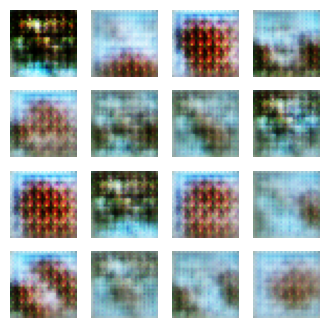

Epoch 1/100
Generator Loss: 2.1482, Discriminator Loss: 0.7446
Time for epoch 1 is 48.41 sec



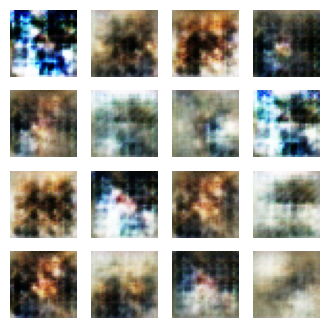

Epoch 2/100
Generator Loss: 2.1479, Discriminator Loss: 0.7248
Time for epoch 2 is 38.86 sec



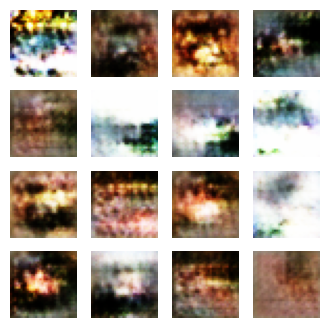

Epoch 3/100
Generator Loss: 2.0212, Discriminator Loss: 0.7713
Time for epoch 3 is 39.71 sec



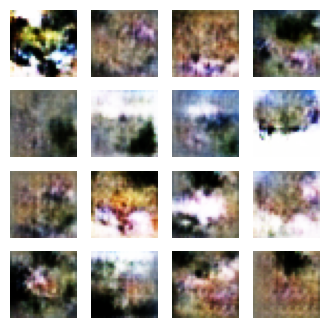

Epoch 4/100
Generator Loss: 1.8929, Discriminator Loss: 0.8306
Time for epoch 4 is 39.67 sec



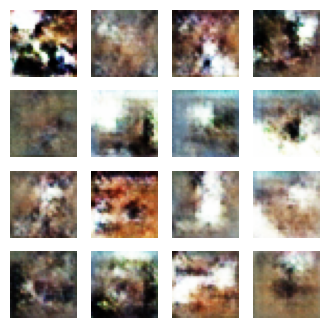

Epoch 5/100
Generator Loss: 2.0428, Discriminator Loss: 0.7735
Time for epoch 5 is 39.76 sec



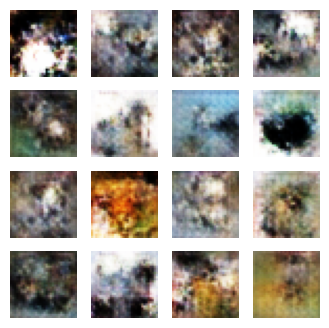

Epoch 6/100
Generator Loss: 2.2545, Discriminator Loss: 0.7007
Time for epoch 6 is 39.60 sec



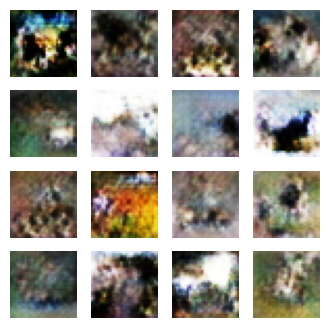

Epoch 7/100
Generator Loss: 2.2526, Discriminator Loss: 0.6879
Time for epoch 7 is 39.56 sec



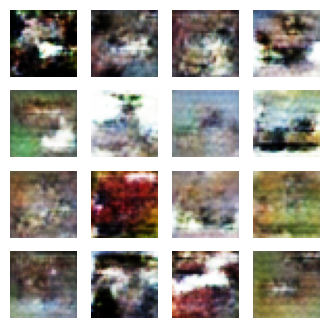

Epoch 8/100
Generator Loss: 2.2441, Discriminator Loss: 0.6890
Time for epoch 8 is 39.54 sec



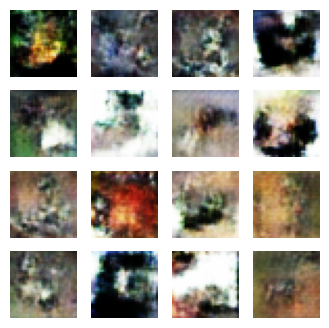

Epoch 9/100
Generator Loss: 2.3427, Discriminator Loss: 0.6596
Time for epoch 9 is 39.81 sec



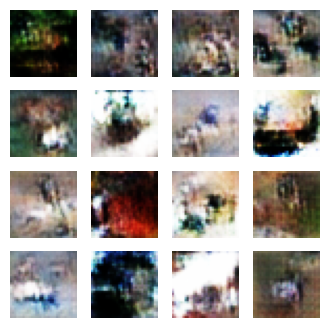

Epoch 10/100
Generator Loss: 2.3118, Discriminator Loss: 0.6648
Time for epoch 10 is 39.79 sec



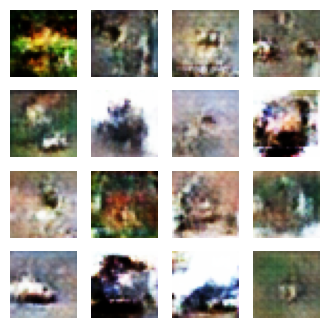

Epoch 11/100
Generator Loss: 2.2184, Discriminator Loss: 0.6976
Time for epoch 11 is 39.59 sec



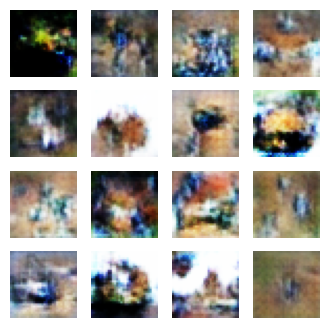

Epoch 12/100
Generator Loss: 2.0977, Discriminator Loss: 0.7311
Time for epoch 12 is 39.57 sec



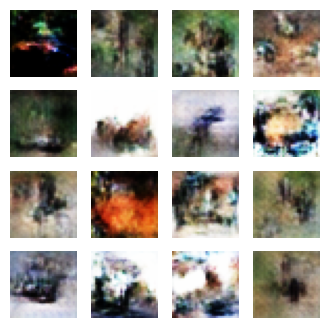

Epoch 13/100
Generator Loss: 2.0652, Discriminator Loss: 0.7454
Time for epoch 13 is 39.55 sec



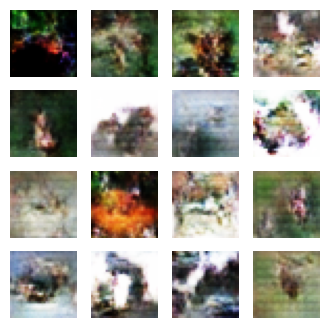

Epoch 14/100
Generator Loss: 2.0408, Discriminator Loss: 0.7488
Time for epoch 14 is 39.83 sec



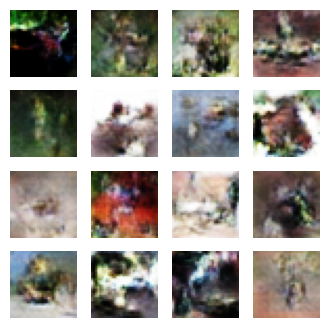

Epoch 15/100
Generator Loss: 2.0036, Discriminator Loss: 0.7596
Time for epoch 15 is 39.55 sec



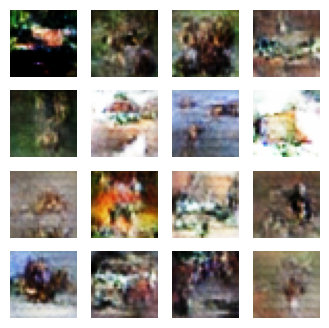

Epoch 16/100
Generator Loss: 1.9836, Discriminator Loss: 0.7680
Time for epoch 16 is 39.83 sec



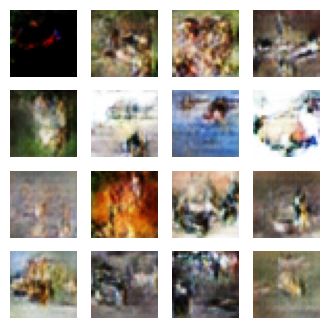

Epoch 17/100
Generator Loss: 1.9879, Discriminator Loss: 0.7664
Time for epoch 17 is 39.52 sec



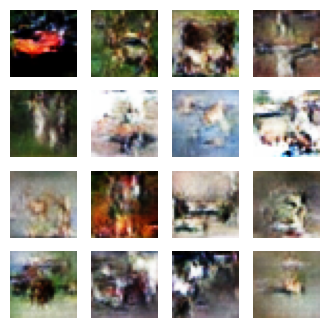

Epoch 18/100
Generator Loss: 2.0473, Discriminator Loss: 0.7498
Time for epoch 18 is 39.54 sec



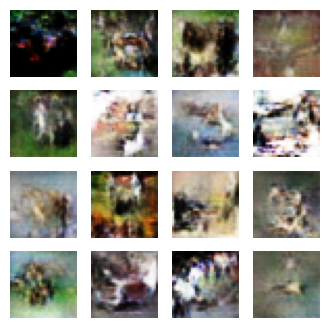

Epoch 19/100
Generator Loss: 2.0343, Discriminator Loss: 0.7464
Time for epoch 19 is 39.78 sec



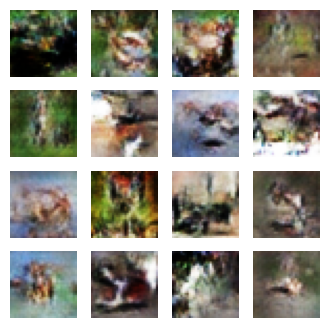

Epoch 20/100
Generator Loss: 2.0915, Discriminator Loss: 0.7350
Time for epoch 20 is 39.55 sec



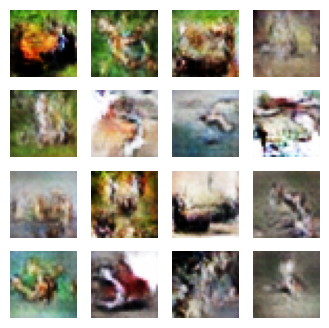

Epoch 21/100
Generator Loss: 2.0553, Discriminator Loss: 0.7517
Time for epoch 21 is 39.80 sec



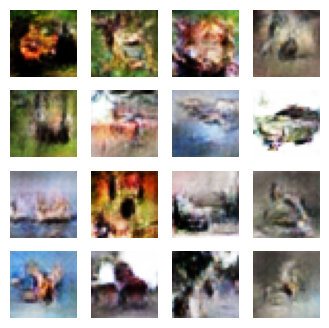

Epoch 22/100
Generator Loss: 2.0696, Discriminator Loss: 0.7448
Time for epoch 22 is 39.58 sec



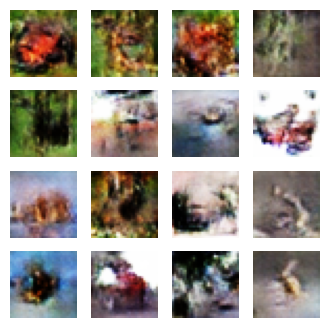

Epoch 23/100
Generator Loss: 2.0399, Discriminator Loss: 0.7565
Time for epoch 23 is 39.55 sec



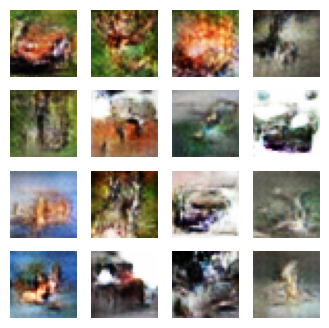

Epoch 24/100
Generator Loss: 2.0282, Discriminator Loss: 0.7622
Time for epoch 24 is 39.83 sec



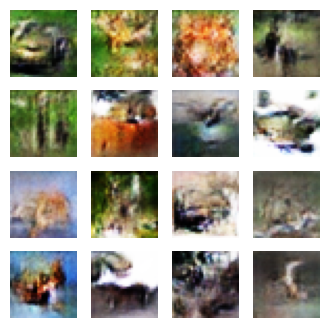

Epoch 25/100
Generator Loss: 2.0149, Discriminator Loss: 0.7646
Time for epoch 25 is 39.86 sec



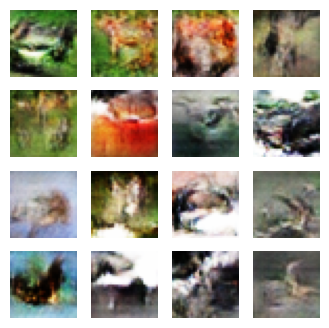

Epoch 26/100
Generator Loss: 2.0050, Discriminator Loss: 0.7767
Time for epoch 26 is 39.86 sec



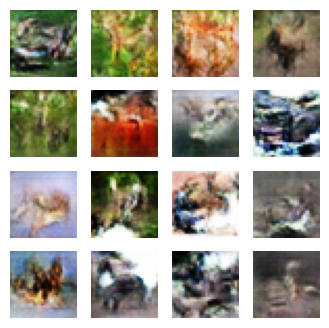

Epoch 27/100
Generator Loss: 2.0004, Discriminator Loss: 0.7730
Time for epoch 27 is 39.49 sec



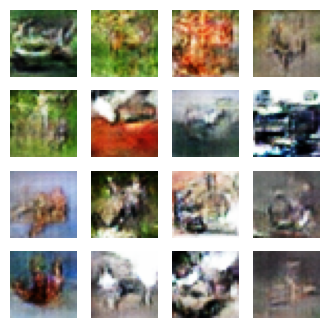

Epoch 28/100
Generator Loss: 1.9845, Discriminator Loss: 0.7771
Time for epoch 28 is 39.53 sec



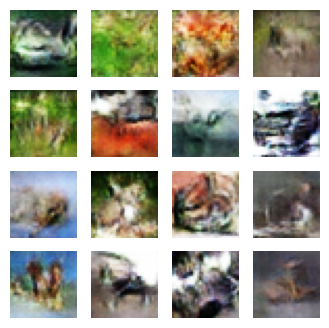

Epoch 29/100
Generator Loss: 1.9820, Discriminator Loss: 0.7808
Time for epoch 29 is 39.57 sec



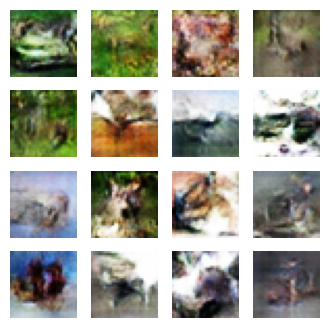

Epoch 30/100
Generator Loss: 1.9844, Discriminator Loss: 0.7818
Time for epoch 30 is 39.82 sec



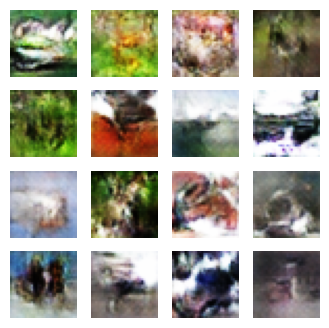

Epoch 31/100
Generator Loss: 1.9650, Discriminator Loss: 0.7975
Time for epoch 31 is 39.73 sec



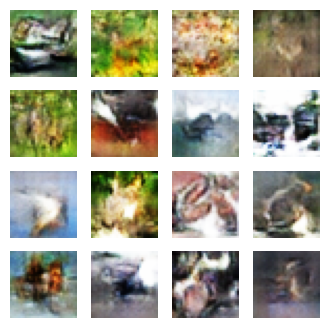

Epoch 32/100
Generator Loss: 1.9604, Discriminator Loss: 0.7892
Time for epoch 32 is 39.50 sec



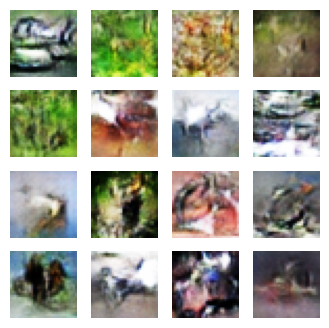

Epoch 33/100
Generator Loss: 1.8773, Discriminator Loss: 0.8264
Time for epoch 33 is 39.50 sec



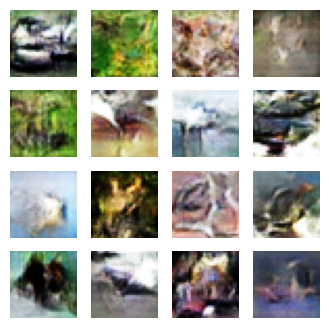

Epoch 34/100
Generator Loss: 1.8962, Discriminator Loss: 0.8171
Time for epoch 34 is 39.53 sec



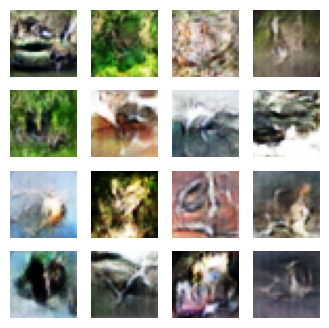

Epoch 35/100
Generator Loss: 1.8371, Discriminator Loss: 0.8479
Time for epoch 35 is 39.90 sec



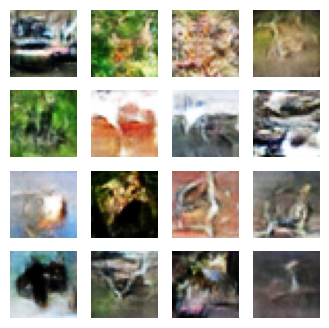

Epoch 36/100
Generator Loss: 1.8793, Discriminator Loss: 0.8129
Time for epoch 36 is 39.77 sec



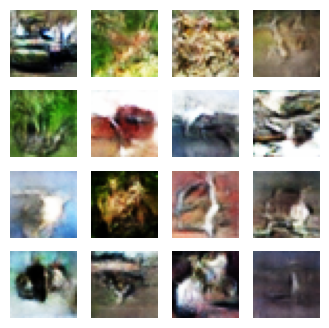

Epoch 37/100
Generator Loss: 1.8555, Discriminator Loss: 0.8349
Time for epoch 37 is 39.54 sec



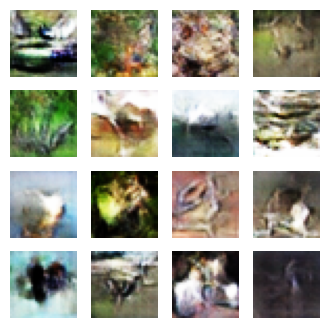

Epoch 38/100
Generator Loss: 1.8553, Discriminator Loss: 0.8303
Time for epoch 38 is 39.56 sec



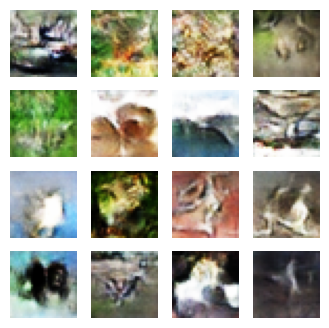

Epoch 39/100
Generator Loss: 1.8370, Discriminator Loss: 0.8420
Time for epoch 39 is 39.59 sec



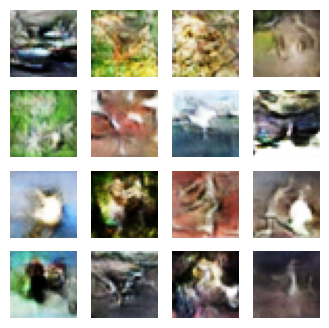

Epoch 40/100
Generator Loss: 1.8273, Discriminator Loss: 0.8435
Time for epoch 40 is 39.81 sec



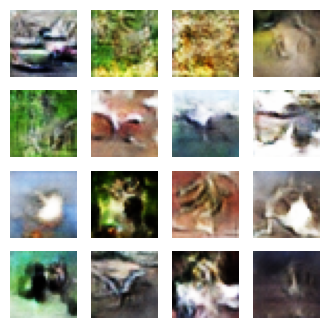

Epoch 41/100
Generator Loss: 1.8573, Discriminator Loss: 0.8348
Time for epoch 41 is 39.59 sec



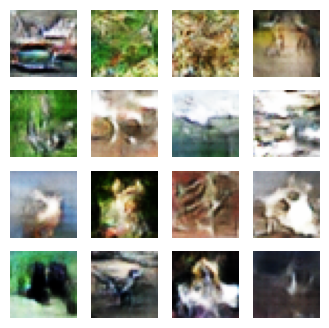

Epoch 42/100
Generator Loss: 1.8391, Discriminator Loss: 0.8439
Time for epoch 42 is 39.80 sec



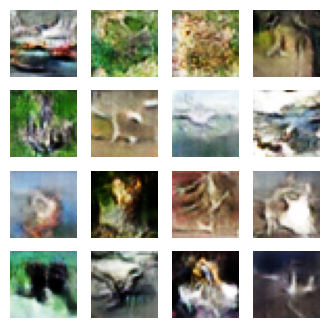

Epoch 43/100
Generator Loss: 1.8346, Discriminator Loss: 0.8392
Time for epoch 43 is 39.51 sec



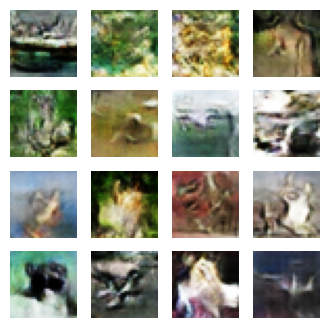

Epoch 44/100
Generator Loss: 1.8351, Discriminator Loss: 0.8442
Time for epoch 44 is 39.53 sec



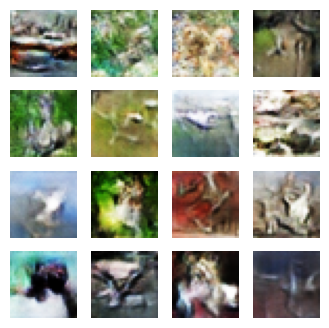

Epoch 45/100
Generator Loss: 1.8136, Discriminator Loss: 0.8552
Time for epoch 45 is 39.41 sec



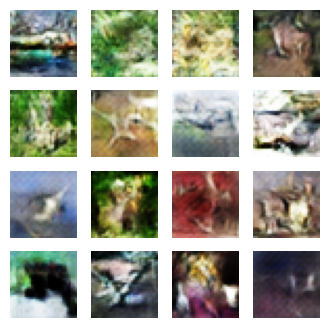

Epoch 46/100
Generator Loss: 1.8322, Discriminator Loss: 0.8514
Time for epoch 46 is 39.83 sec



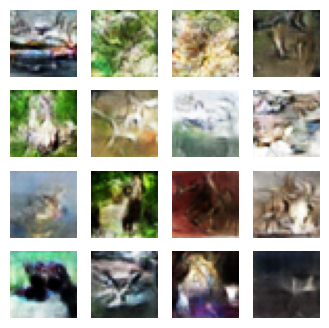

Epoch 47/100
Generator Loss: 1.7945, Discriminator Loss: 0.8644
Time for epoch 47 is 39.73 sec



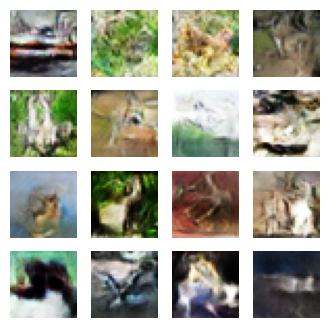

Epoch 48/100
Generator Loss: 1.8006, Discriminator Loss: 0.8615
Time for epoch 48 is 39.89 sec



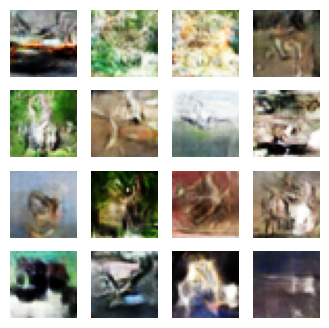

Epoch 49/100
Generator Loss: 1.8086, Discriminator Loss: 0.8540
Time for epoch 49 is 39.54 sec



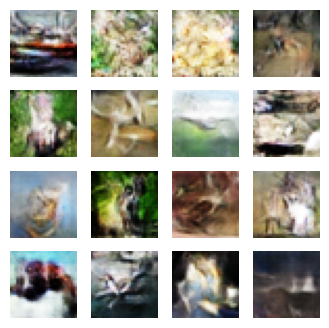

Epoch 50/100
Generator Loss: 1.7618, Discriminator Loss: 0.8762
Time for epoch 50 is 39.56 sec



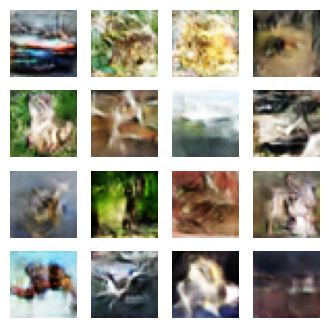

Epoch 51/100
Generator Loss: 1.7958, Discriminator Loss: 0.8612
Time for epoch 51 is 39.88 sec



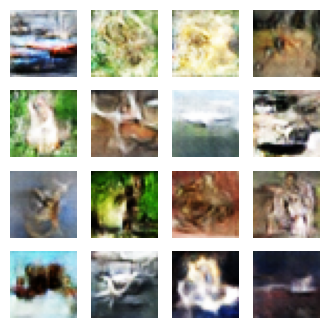

Epoch 52/100
Generator Loss: 1.7485, Discriminator Loss: 0.8804
Time for epoch 52 is 39.51 sec



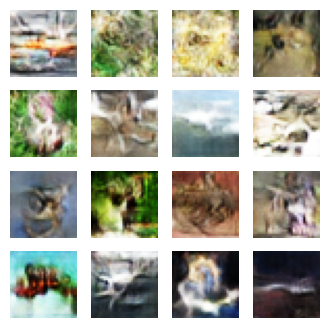

Epoch 53/100
Generator Loss: 1.7817, Discriminator Loss: 0.8732
Time for epoch 53 is 39.50 sec



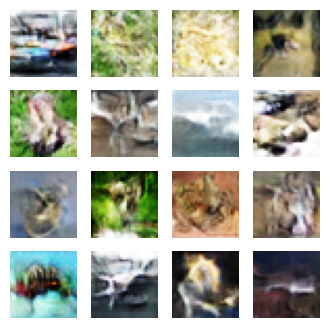

Epoch 54/100
Generator Loss: 1.7183, Discriminator Loss: 0.9012
Time for epoch 54 is 39.89 sec



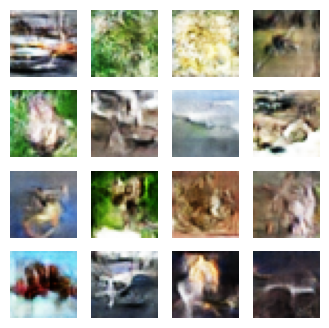

Epoch 55/100
Generator Loss: 1.7685, Discriminator Loss: 0.8797
Time for epoch 55 is 39.51 sec



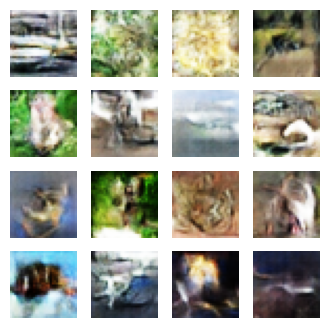

Epoch 56/100
Generator Loss: 1.7429, Discriminator Loss: 0.8875
Time for epoch 56 is 39.70 sec



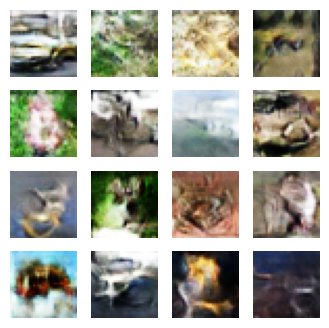

Epoch 57/100
Generator Loss: 1.7516, Discriminator Loss: 0.8890
Time for epoch 57 is 39.52 sec



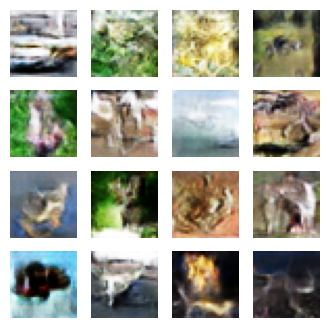

Epoch 58/100
Generator Loss: 1.7334, Discriminator Loss: 0.8895
Time for epoch 58 is 39.55 sec



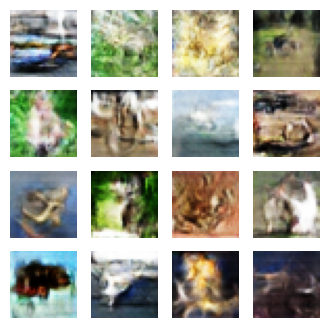

Epoch 59/100
Generator Loss: 1.7578, Discriminator Loss: 0.8820
Time for epoch 59 is 39.74 sec



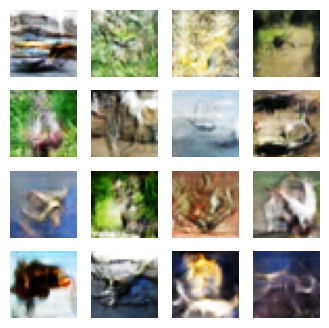

Epoch 60/100
Generator Loss: 1.7223, Discriminator Loss: 0.8989
Time for epoch 60 is 39.65 sec



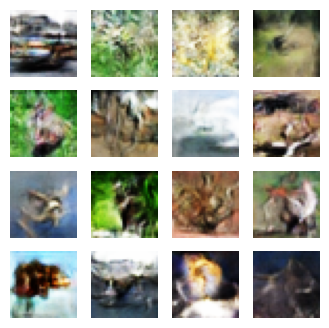

Epoch 61/100
Generator Loss: 1.7387, Discriminator Loss: 0.8993
Time for epoch 61 is 39.86 sec



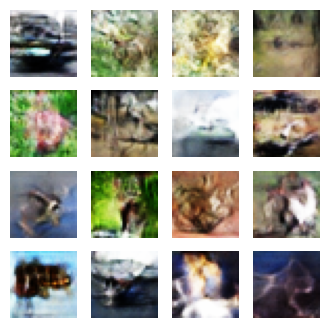

Epoch 62/100
Generator Loss: 1.7547, Discriminator Loss: 0.8854
Time for epoch 62 is 39.56 sec



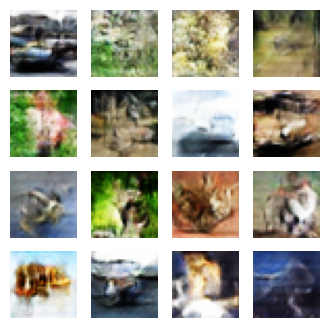

Epoch 63/100
Generator Loss: 1.7997, Discriminator Loss: 0.8773
Time for epoch 63 is 39.48 sec



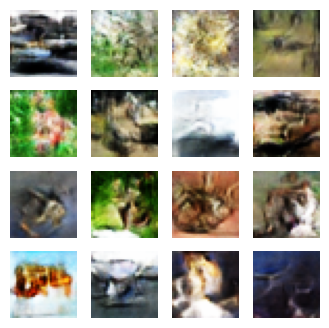

Epoch 64/100
Generator Loss: 1.7729, Discriminator Loss: 0.8845
Time for epoch 64 is 39.45 sec



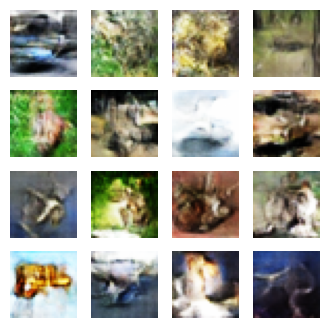

Epoch 65/100
Generator Loss: 1.7864, Discriminator Loss: 0.8793
Time for epoch 65 is 39.81 sec



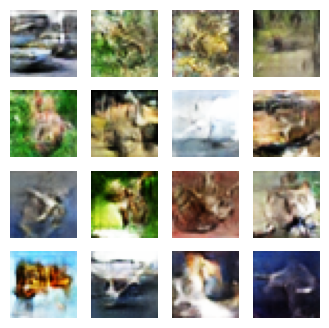

Epoch 66/100
Generator Loss: 1.8264, Discriminator Loss: 0.8755
Time for epoch 66 is 39.57 sec



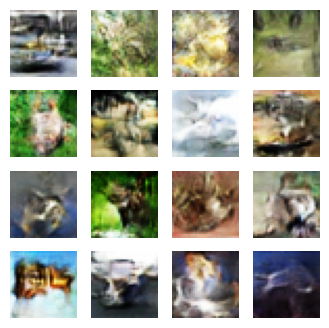

Epoch 67/100
Generator Loss: 1.8797, Discriminator Loss: 0.8454
Time for epoch 67 is 39.80 sec



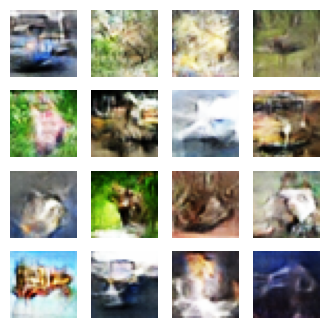

Epoch 68/100
Generator Loss: 1.8831, Discriminator Loss: 0.8474
Time for epoch 68 is 39.50 sec



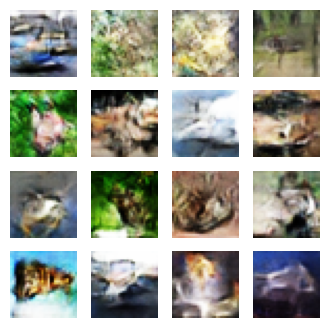

Epoch 69/100
Generator Loss: 1.8924, Discriminator Loss: 0.8465
Time for epoch 69 is 39.53 sec



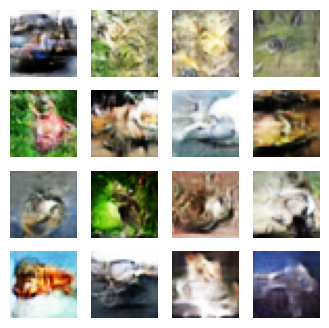

Epoch 70/100
Generator Loss: 1.8836, Discriminator Loss: 0.8567
Time for epoch 70 is 41.40 sec



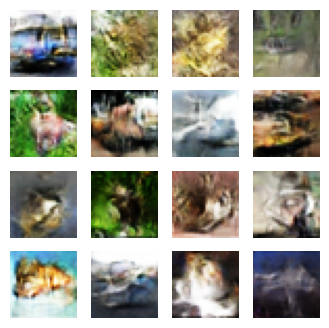

Epoch 71/100
Generator Loss: 1.9400, Discriminator Loss: 0.8170
Time for epoch 71 is 39.62 sec



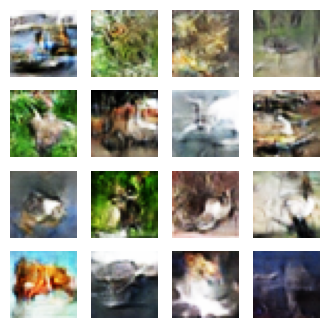

Epoch 72/100
Generator Loss: 1.9367, Discriminator Loss: 0.8274
Time for epoch 72 is 39.83 sec



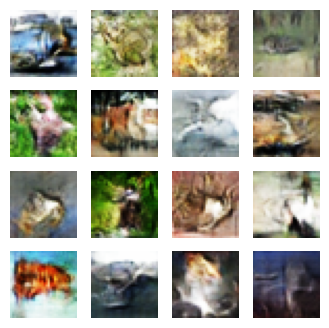

Epoch 73/100
Generator Loss: 1.9139, Discriminator Loss: 0.8386
Time for epoch 73 is 39.51 sec



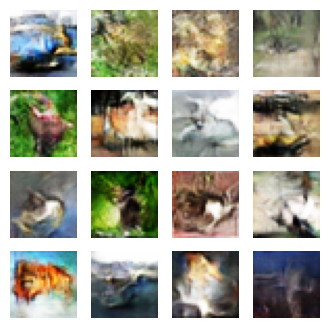

Epoch 74/100
Generator Loss: 1.9228, Discriminator Loss: 0.8460
Time for epoch 74 is 39.72 sec



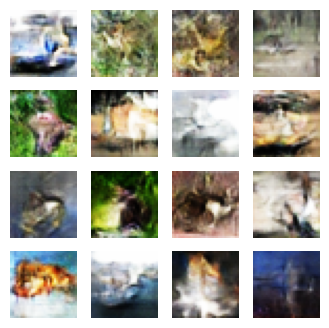

Epoch 75/100
Generator Loss: 1.9390, Discriminator Loss: 0.8260
Time for epoch 75 is 39.82 sec



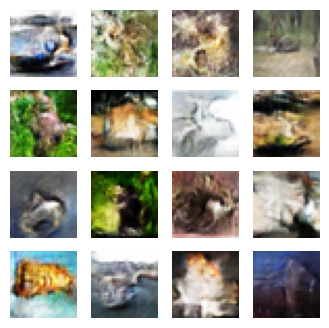

Epoch 76/100
Generator Loss: 1.9578, Discriminator Loss: 0.8121
Time for epoch 76 is 39.51 sec



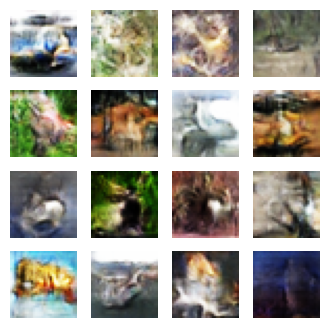

Epoch 77/100
Generator Loss: 1.9756, Discriminator Loss: 0.8149
Time for epoch 77 is 39.85 sec



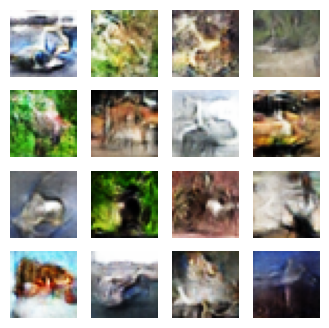

Epoch 78/100
Generator Loss: 2.0301, Discriminator Loss: 0.7949
Time for epoch 78 is 39.51 sec



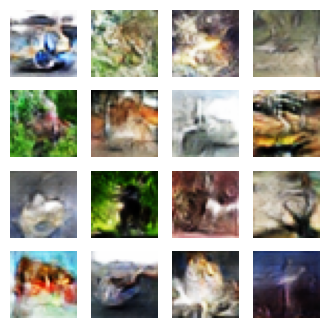

Epoch 79/100
Generator Loss: 1.9081, Discriminator Loss: 0.8393
Time for epoch 79 is 39.76 sec



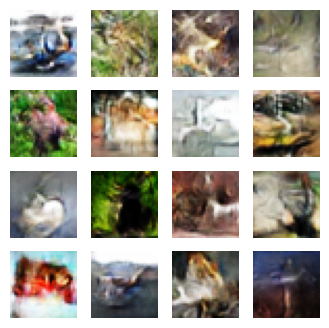

Epoch 80/100
Generator Loss: 1.9548, Discriminator Loss: 0.8187
Time for epoch 80 is 39.54 sec



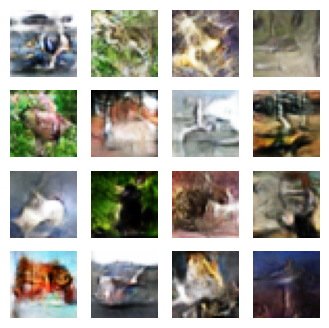

Epoch 81/100
Generator Loss: 1.9296, Discriminator Loss: 0.8545
Time for epoch 81 is 39.56 sec



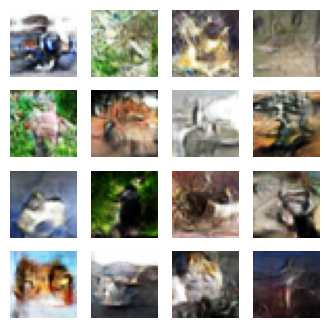

Epoch 82/100
Generator Loss: 1.9610, Discriminator Loss: 0.8018
Time for epoch 82 is 39.84 sec



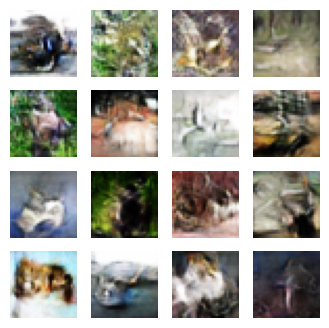

Epoch 83/100
Generator Loss: 1.9700, Discriminator Loss: 0.8138
Time for epoch 83 is 39.54 sec



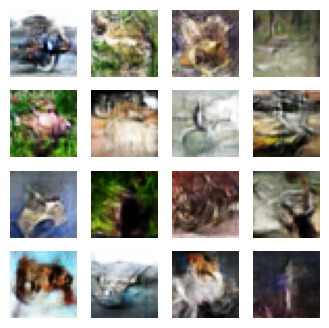

Epoch 84/100
Generator Loss: 1.9616, Discriminator Loss: 0.8193
Time for epoch 84 is 39.68 sec



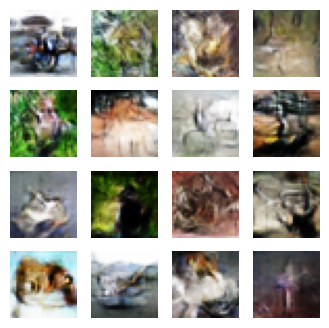

Epoch 85/100
Generator Loss: 1.9602, Discriminator Loss: 0.8269
Time for epoch 85 is 39.71 sec



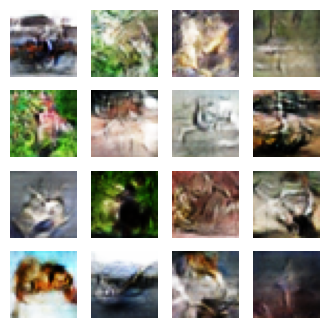

Epoch 86/100
Generator Loss: 2.0056, Discriminator Loss: 0.7999
Time for epoch 86 is 39.50 sec



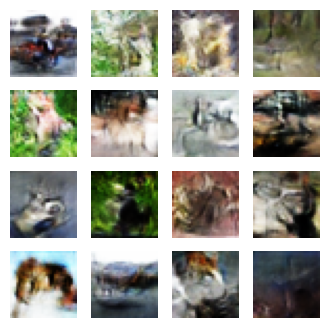

Epoch 87/100
Generator Loss: 1.9890, Discriminator Loss: 0.8118
Time for epoch 87 is 39.51 sec



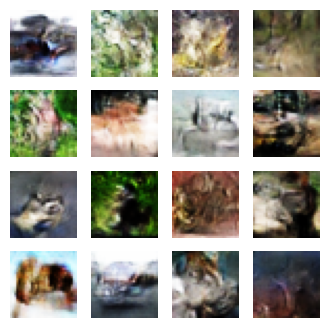

Epoch 88/100
Generator Loss: 2.0248, Discriminator Loss: 0.7981
Time for epoch 88 is 39.77 sec



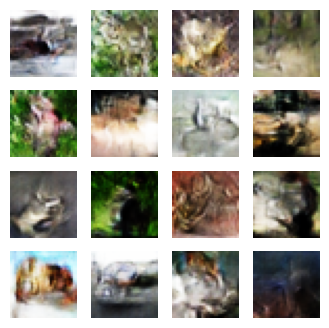

Epoch 89/100
Generator Loss: 2.0119, Discriminator Loss: 0.8069
Time for epoch 89 is 39.54 sec



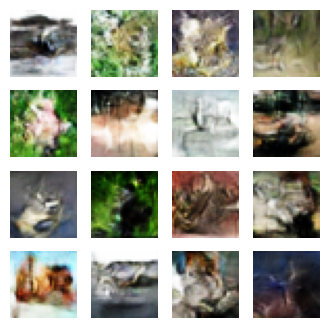

Epoch 90/100
Generator Loss: 2.0014, Discriminator Loss: 0.8173
Time for epoch 90 is 39.79 sec



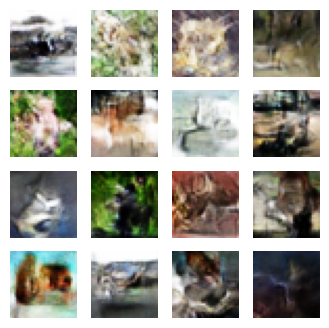

Epoch 91/100
Generator Loss: 2.0149, Discriminator Loss: 0.8052
Time for epoch 91 is 39.48 sec



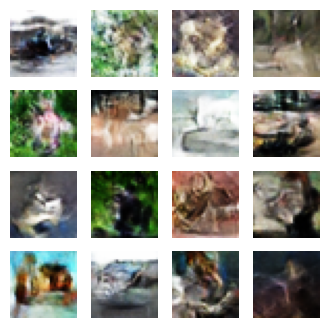

Epoch 92/100
Generator Loss: 2.0072, Discriminator Loss: 0.8072
Time for epoch 92 is 39.50 sec



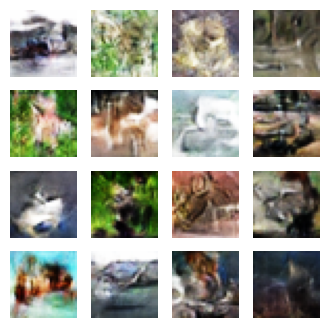

Epoch 93/100
Generator Loss: 1.9919, Discriminator Loss: 0.8178
Time for epoch 93 is 39.85 sec



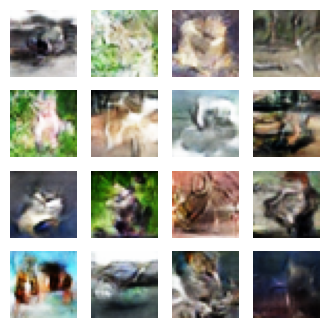

Epoch 94/100
Generator Loss: 1.9931, Discriminator Loss: 0.8188
Time for epoch 94 is 39.54 sec



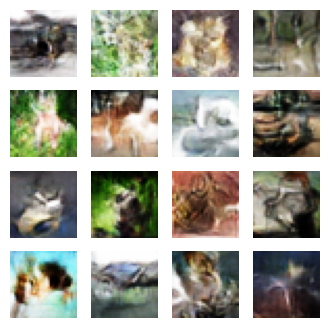

Epoch 95/100
Generator Loss: 2.0364, Discriminator Loss: 0.7973
Time for epoch 95 is 39.75 sec



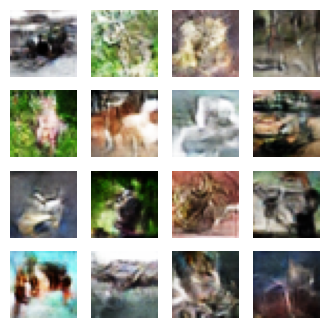

Epoch 96/100
Generator Loss: 2.0795, Discriminator Loss: 0.7822
Time for epoch 96 is 39.70 sec



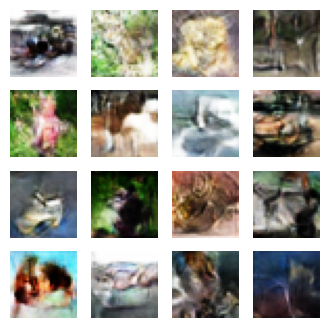

Epoch 97/100
Generator Loss: 2.0873, Discriminator Loss: 0.7925
Time for epoch 97 is 39.52 sec



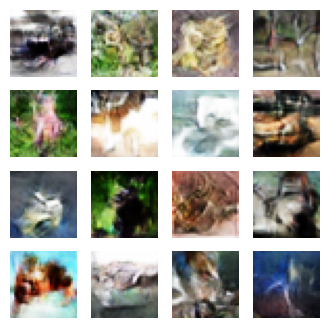

Epoch 98/100
Generator Loss: 2.0259, Discriminator Loss: 0.8152
Time for epoch 98 is 39.77 sec



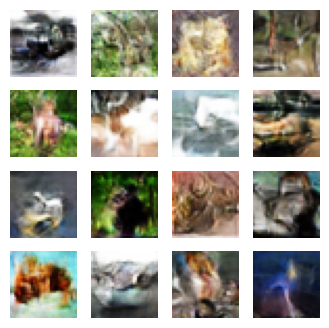

Epoch 99/100
Generator Loss: 2.0529, Discriminator Loss: 0.8005
Time for epoch 99 is 39.50 sec



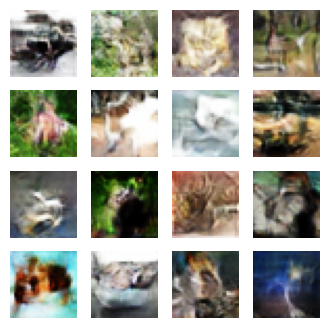

Epoch 100/100
Generator Loss: 2.0400, Discriminator Loss: 0.8009
Time for epoch 100 is 39.59 sec



In [22]:
train(train_dataset, EPOCHS)

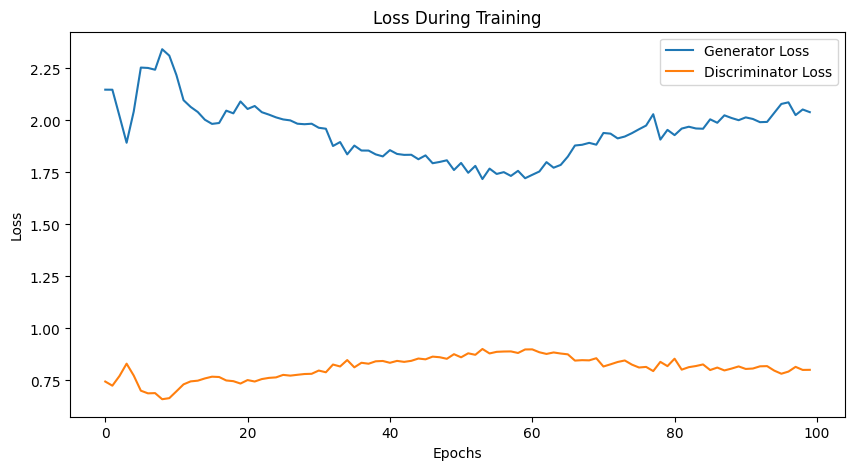

In [23]:
 # Plot the generator and discriminator loss
plt.figure(figsize=(10, 5))
plt.plot(gen_losses, label='Generator Loss')
plt.plot(disc_losses, label='Discriminator Loss')
plt.title('Loss During Training')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


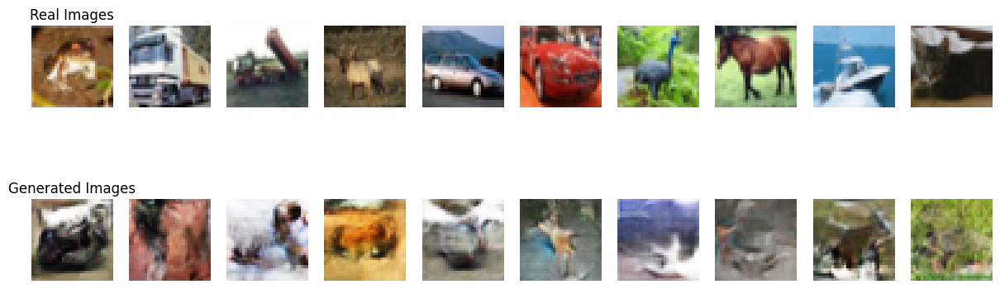

In [24]:
from tensorflow.keras.datasets import cifar10

# Load real CIFAR-10 images
(real_images, _), _ = cifar10.load_data()
real_images = (real_images / 127.5) - 1  # Normalize to match GAN's output range [-1,1]

# Generate fake images
noise = np.random.normal(0, 1, (10, 100))  # Generate random noise
fake_images = generator.predict(noise)  # Generate images using trained generator
fake_images = (fake_images + 1) / 2  # Rescale to [0,1] for visualization

# Plot real vs. fake images
fig, axes = plt.subplots(2, 10, figsize=(15, 5))

for i in range(10):
    axes[0, i].imshow((real_images[i] + 1) / 2)  # Convert back to [0,1] range
    axes[0, i].axis('off')
    axes[1, i].imshow(fake_images[i])
    axes[1, i].axis('off')

axes[0, 0].set_title("Real Images")
axes[1, 0].set_title("Generated Images")
plt.show()


In [25]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from scipy.linalg import sqrtm

def calculate_fid(real_images, fake_images):
    # Load pretrained InceptionV3 model
    model = InceptionV3(include_top=False, pooling='avg', input_shape=(75, 75, 3))

    # Resize images to 75x75 (InceptionV3 requirement)
    real_images = tf.image.resize(real_images, (75, 75))
    fake_images = tf.image.resize(fake_images, (75, 75))

    # Extract feature representations
    real_features = model.predict(preprocess_input(real_images))
    fake_features = model.predict(preprocess_input(fake_images))

    # Calculate mean and covariance
    mu_real, sigma_real = real_features.mean(axis=0), np.cov(real_features, rowvar=False)
    mu_fake, sigma_fake = fake_features.mean(axis=0), np.cov(fake_features, rowvar=False)

    # Compute FID score
    fid_score = np.sum((mu_real - mu_fake) ** 2) + np.trace(sigma_real + sigma_fake - 2 * sqrtm(sigma_real @ sigma_fake))

    return fid_score

# Compute FID
fid = calculate_fid(real_images[:1000], fake_images[:1000])
print(f"FID Score: {fid:.2f}")


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 16s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
FID Score: 149.49-0.00j
